--- 1. Loading and Filtering Data ---
Dropped 450 rows (BI-RADS 3 or missing). Remaining: 2793
Filtered for Mass cases only. Remaining: 1335

--- Matching Crop Files to Crop ROI Masks ---
Successfully matched 1335 crops to aligned ROI masks out of 1335 total rows.

--- 2. Patient-Level Stratified Splitting ---

--- 3. Visualizing Alignment (FULL | CROP | CROP-ALIGNED ROI) ---


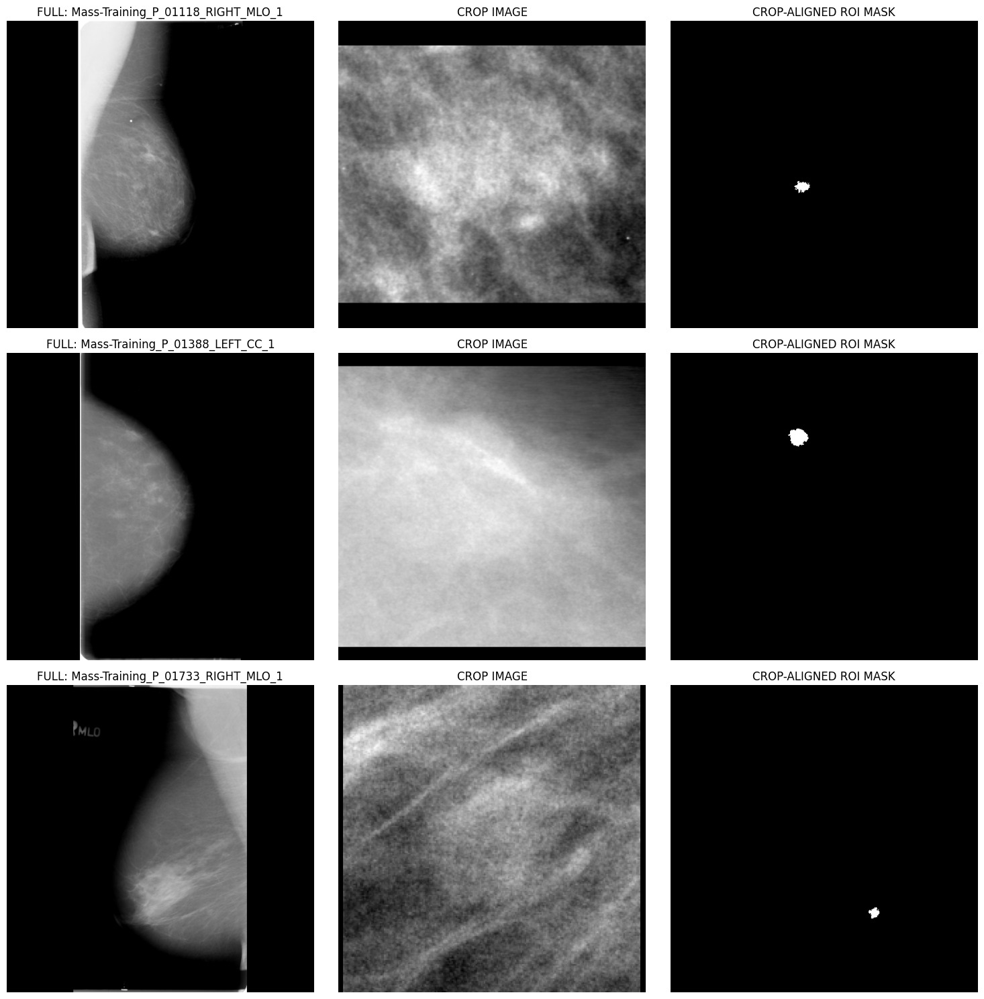


Saved clean dataset to: CBIS_Master_Index_Clean.csv


In [1]:
# ==============================================================================
# EXP-01 — Data Loading, Mass Filter & Crop ROI Matching
# ==============================================================================

import os
import re
import glob
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# --- Configuration ---
DATA_DIR = "/kaggle/input/datasets/abdelrahmanelmugh/cbis-ddsm-512-full1-wm/CBIS-DDSM-512-FULL1/CBIS-DDSM-512-FULL1"
KAGGLE_CSV_DIR = "/kaggle/input/datasets/abdelrahmanelmugh/metdatakagglegrad/Kaggle_CSVs"
MASTER_CSV_PATH = "/kaggle/input/datasets/abdelrahmanelmugh/cbis-ddsm-512-full1-wm/CBIS_Master_Index.csv"
RANDOM_SEED = 42

def load_and_extract_birads():
    csv_files = [
        "mass_case_description_train_set.csv", "mass_case_description_test_set.csv",
        "calc_case_description_train_set.csv", "calc_case_description_test_set.csv"
    ]
    combined_df = pd.DataFrame()
    for file in csv_files:
        path = os.path.join(KAGGLE_CSV_DIR, file)
        if os.path.exists(path):
            df = pd.read_csv(path)
            combined_df = pd.concat([combined_df, df], ignore_index=True)
    
    def get_case_id(path): return str(path).split('/')[0].strip()
    combined_df['Case_ID'] = combined_df['image file path'].apply(get_case_id)
    return dict(zip(combined_df['Case_ID'], combined_df['assessment']))

def match_birads(patient_id, birads_map):
    if patient_id in birads_map: return birads_map[patient_id]
    base = re.sub(r'_\d+$', '', patient_id)
    if base in birads_map: return birads_map[base]
    return None

def match_crop_to_roi(df, data_dir):
    print("\n--- Matching Crop Files to Crop ROI Masks ---")
    
    # 1. Gather all files in the roi/ folder
    roi_dir = os.path.join(data_dir, "roi")
    all_roi_files = []
    if os.path.exists(roi_dir):
        for root, _, files in os.walk(roi_dir):
            for file in files:
                all_roi_files.append(os.path.relpath(os.path.join(root, file), data_dir))
    
    # 2. Build a mapping of Base Key -> ROI File Path
    roi_map = {}
    for roi_path in all_roi_files:
        filename = os.path.basename(roi_path)
        # Extract base key: strip everything from _ROI_ onward
        if "_ROI_" in filename:
            base_key = filename.split("_ROI_")[0]
            roi_map[base_key] = roi_path

    # 3. Match crops to ROIs
    matched_paths = []
    success_count = 0
    
    for crop_path in df['Crop_Path']:
        if pd.isna(crop_path):
            matched_paths.append(None)
            continue
            
        crop_filename = os.path.basename(crop_path)
        # Extract base key: strip everything from _CROP_ onward
        if "_CROP_" in crop_filename:
            base_key = crop_filename.split("_CROP_")[0]
            
            if base_key in roi_map:
                matched_paths.append(roi_map[base_key])
                success_count += 1
            else:
                matched_paths.append(None)
        else:
            matched_paths.append(None)
            
    df['Crop_ROI_Path'] = matched_paths
    print(f"Successfully matched {success_count} crops to aligned ROI masks out of {len(df)} total rows.")
    
    # Drop rows that failed to find a crop mask match
    df = df.dropna(subset=['Crop_ROI_Path']).copy()
    return df

def main():
    print("--- 1. Loading and Filtering Data ---")
    df = pd.read_csv(MASTER_CSV_PATH)
    initial_count = len(df)
    
    birads_map = load_and_extract_birads()
    df['BI_RADS'] = df['PatientID'].apply(lambda pid: match_birads(pid, birads_map))
    df = df[df['BI_RADS'].notna() & (df['BI_RADS'] != 3)].copy()
    print(f"Dropped {initial_count - len(df)} rows (BI-RADS 3 or missing). Remaining: {len(df)}")
    
    # Mass-only filter
    df = df[df['PatientID'].str.contains("Mass", case=False, na=False)].copy()
    print(f"Filtered for Mass cases only. Remaining: {len(df)}")
    
    # Match Crop ROIs
    df = match_crop_to_roi(df, DATA_DIR)
    
    df['Label'] = df['Pathology'].map({'MALIGNANT': 1, 'BENIGN': 0})
    df['True_Patient_ID'] = df['PatientID'].apply(lambda x: re.search(r'(P_\d+)', x).group(1))

    print("\n--- 2. Patient-Level Stratified Splitting ---")
    patient_df = df.groupby('True_Patient_ID')['Label'].max().reset_index()
    patient_df.columns = ['True_Patient_ID', 'Patient_Label']
    
    train_patients, temp_patients, _, temp_labels = train_test_split(
        patient_df['True_Patient_ID'], patient_df['Patient_Label'],
        test_size=0.30, random_state=RANDOM_SEED, stratify=patient_df['Patient_Label']
    )
    
    val_patients, test_patients = train_test_split(
        temp_patients, test_size=(2/3), random_state=RANDOM_SEED, stratify=temp_labels
    )
    
    train_set, val_set, test_set = set(train_patients), set(val_patients), set(test_patients)

    def assign_split(pid):
        if pid in train_set: return 'Train'
        if pid in val_set: return 'Val'
        return 'Test'

    df['Patient_Split'] = df['True_Patient_ID'].apply(assign_split)

    print("\n--- 3. Visualizing Alignment (FULL | CROP | CROP-ALIGNED ROI) ---")
    sample_df = df.sample(3, random_state=RANDOM_SEED)
    fig, axes = plt.subplots(3, 3, figsize=(15, 15)) 

    for idx, (_, row) in enumerate(sample_df.iterrows()):
        full_path = os.path.join(DATA_DIR, row['Full_Path'])
        crop_path = os.path.join(DATA_DIR, row['Crop_Path'])
        crop_roi_path = os.path.join(DATA_DIR, row['Crop_ROI_Path'])
        
        full_img = cv2.imread(full_path, cv2.IMREAD_UNCHANGED)
        crop_img = cv2.imread(crop_path, cv2.IMREAD_UNCHANGED)
        crop_roi_img = cv2.imread(crop_roi_path, cv2.IMREAD_UNCHANGED)
        
        full_disp = full_img.astype(np.float32) / 65535.0
        crop_disp = crop_img.astype(np.float32) / 65535.0
        crop_roi_disp = crop_roi_img.astype(np.float32) / np.max(crop_roi_img) if np.max(crop_roi_img) > 0 else crop_roi_img

        axes[idx, 0].imshow(full_disp, cmap='gray')
        axes[idx, 0].set_title(f"FULL: {row['PatientID']}")
        axes[idx, 0].axis('off')
        
        axes[idx, 1].imshow(crop_disp, cmap='gray')
        axes[idx, 1].set_title(f"CROP IMAGE")
        axes[idx, 1].axis('off')
        
        axes[idx, 2].imshow(crop_roi_disp, cmap='gray')
        axes[idx, 2].set_title(f"CROP-ALIGNED ROI MASK")
        axes[idx, 2].axis('off')

    plt.tight_layout()
    plt.show()

    out_csv = "CBIS_Master_Index_Clean.csv"
    df.to_csv(out_csv, index=False)
    print(f"\nSaved clean dataset to: {out_csv}")

if __name__ == "__main__":
    main()

In [2]:
!pip install monai -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 68.6 MB/s eta 0:00:00:00:01


<frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
2026-04-29 22:22:28.171851: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1777501348.375870      57 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1777501348.438242      57 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1777501348.927559      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777501348.927616      57 computation_placer.cc:1

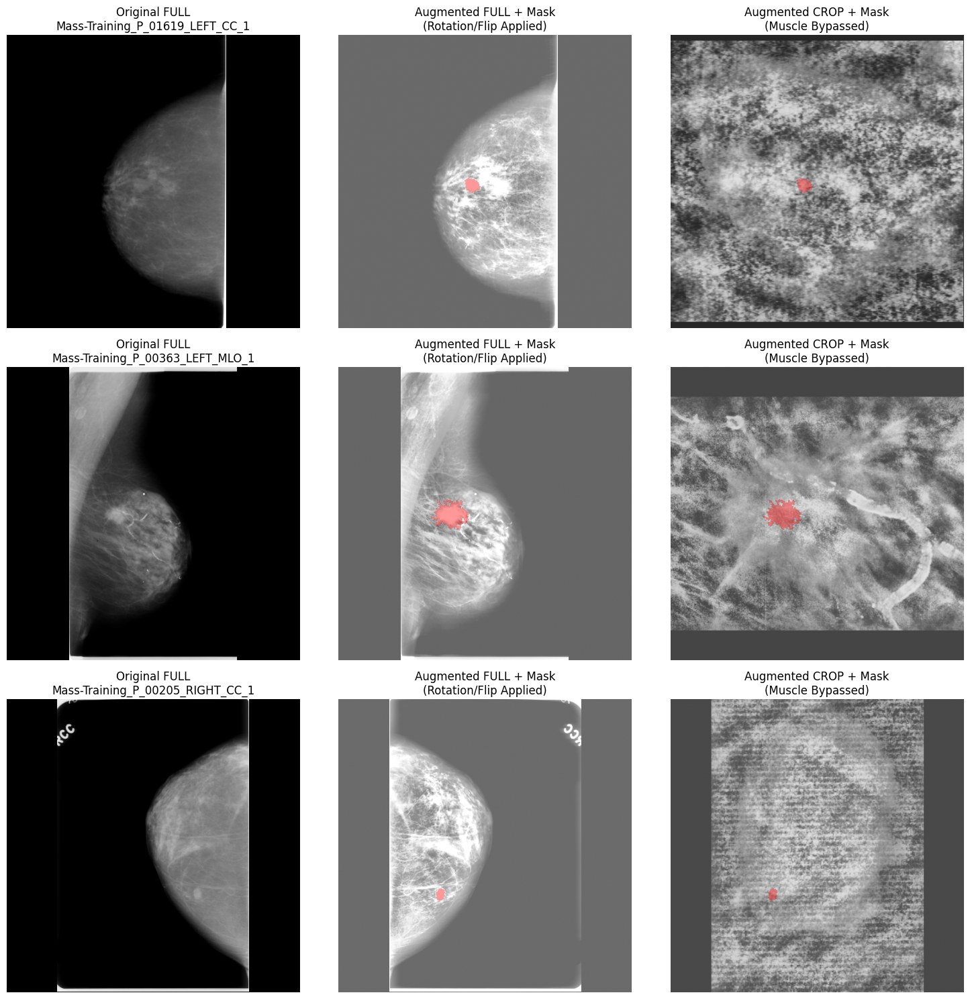

In [3]:
import os
import cv2
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from monai.transforms import MapTransform, Compose, EnsureChannelFirstd, RandFlipd, RandRotated

# --- Configuration ---
DATA_DIR = "/kaggle/input/datasets/abdelrahmanelmugh/cbis-ddsm-512-full1-wm/CBIS-DDSM-512-FULL1/CBIS-DDSM-512-FULL1" 
CSV_PATH = "CBIS_Master_Index_Clean.csv"      
RANDOM_SEED = 42

# ==============================================================================
# 1. Custom MONAI Dictionary Transforms
# ==============================================================================

class ConditionalFlipd(MapTransform):
    def __init__(self, keys, id_key="patient_id"):
        super().__init__(keys)
        self.id_key = id_key

    def __call__(self, data):
        d = dict(data)
        patient_id = d[self.id_key]
        if "_RIGHT_" in patient_id:
            for key in self.keys:
                d[key] = cv2.flip(d[key], 1)
        return d

class PectoralRemovalMLOd(MapTransform):
    def __init__(self, keys, id_key="patient_id"):
        super().__init__(keys)
        self.id_key = id_key

    def __call__(self, data):
        d = dict(data)
        patient_id = d[self.id_key]
        
        for key in self.keys:
            img = d[key]
            
            # AUTOMATIC BYPASS: CC views or images smaller than 1500px (Crops)
            if "_CC_" in patient_id or img.shape[0] < 1500:
                continue
                
            img_8u = (img / 256).astype(np.uint8)
            _, binary = cv2.threshold(img_8u, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            
            h, w = binary.shape
            flood_mask = np.zeros((h + 2, w + 2), np.uint8)
            cv2.floodFill(binary, flood_mask, (0, 0), 255)
            
            pectoral_region = flood_mask[1:-1, 1:-1]
            d[key] = np.where(pectoral_region == 1, 0, img)
            
        return d

class CLAHE16Bitd(MapTransform):
    def __init__(self, keys, clip_limit=2.0, tile_grid_size=(8, 8)):
        super().__init__(keys)
        self.clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)

    def __call__(self, data):
        d = dict(data)
        for key in self.keys:
            d[key] = self.clahe.apply(d[key].astype(np.uint16))
        return d

class ForegroundZScored(MapTransform):
    def __call__(self, data):
        d = dict(data)
        for key in self.keys:
            img = d[key].astype(np.float32)
            mask = img > 0
            if mask.sum() > 0:
                img[mask] = (img[mask] - img[mask].mean()) / (img[mask].std() + 1e-8)
            d[key] = img
        return d

# ==============================================================================
# 2. Pipeline Definitions (Train vs Val/Test)
# ==============================================================================

def build_train_pipeline():
    return Compose([
        ConditionalFlipd(keys=["image", "roi"]), 
        PectoralRemovalMLOd(keys=["image"]),     
        CLAHE16Bitd(keys=["image"]),             
        ForegroundZScored(keys=["image"]),       
        EnsureChannelFirstd(keys=["image", "roi"], channel_dim="no_channel")
    ])

def build_val_pipeline():
    return Compose([
        ConditionalFlipd(keys=["image", "roi"]), 
        PectoralRemovalMLOd(keys=["image"]),     
        CLAHE16Bitd(keys=["image"]),             
        ForegroundZScored(keys=["image"]), 
        # --- NEW: Augmentations (Training Only) ---
        RandFlipd(keys=["image", "roi"], prob=0.5, spatial_axis=1),
        RandRotated(keys=["image", "roi"], range_x=15 * math.pi / 180, prob=0.5, mode=["bilinear", "nearest"], padding_mode="zeros"),
        # ------------------------------------------
        EnsureChannelFirstd(keys=["image", "roi"], channel_dim="no_channel")
    ])

# ==============================================================================
# 3. Main Execution (Testing Both Full and Crop with Augmentations)
# ==============================================================================

def main():
    df = pd.read_csv(CSV_PATH)
    train_df = df[df['Patient_Split'] == 'Train'].sample(3, random_state=RANDOM_SEED)

    # We use the train_pipeline here to visualize the augmentations
    pipeline = build_train_pipeline()

    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    
    for idx, (_, row) in enumerate(train_df.iterrows()):
        patient_id = row['PatientID']
        
        # Load BOTH images and masks
        full_path = os.path.join(DATA_DIR, row['Full_Path'])
        crop_path = os.path.join(DATA_DIR, row['Crop_Path'])
        roi_path  = os.path.join(DATA_DIR, row['ROI_Path'])
        
        raw_full = cv2.imread(full_path, cv2.IMREAD_UNCHANGED)
        raw_crop = cv2.imread(crop_path, cv2.IMREAD_UNCHANGED)
        raw_roi  = cv2.imread(roi_path, cv2.IMREAD_UNCHANGED)
        raw_roi  = (raw_roi > 0).astype(np.float32)

        # Process FULL image
        full_dict = pipeline({"image": raw_full, "roi": raw_roi, "patient_id": patient_id})
        proc_full = full_dict["image"].squeeze()
        proc_full_roi = full_dict["roi"].squeeze()

        # Process CROP image
        crop_dict = pipeline({"image": raw_crop, "roi": raw_roi, "patient_id": patient_id, "image_type": "CROP"})
        proc_crop = crop_dict["image"].squeeze()
        proc_crop_roi = crop_dict["roi"].squeeze()

        # Visualization
        raw_full_display = raw_full.astype(np.float32) / 65535.0

        axes[idx, 0].imshow(raw_full_display, cmap='gray')
        axes[idx, 0].set_title(f"Original FULL\n{patient_id}")
        axes[idx, 0].axis('off')

        axes[idx, 1].imshow(proc_full, cmap='gray', vmin=-3, vmax=3)
        axes[idx, 1].imshow(np.ma.masked_where(proc_full_roi == 0, proc_full_roi), cmap='autumn', alpha=0.4)
        axes[idx, 1].set_title("Augmented FULL + Mask\n(Rotation/Flip Applied)")
        axes[idx, 1].axis('off')

        axes[idx, 2].imshow(proc_crop, cmap='gray', vmin=-3, vmax=3)
        axes[idx, 2].imshow(np.ma.masked_where(proc_crop_roi == 0, proc_crop_roi), cmap='autumn', alpha=0.4)
        axes[idx, 2].set_title("Augmented CROP + Mask\n(Muscle Bypassed)")
        axes[idx, 2].axis('off')

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

In [4]:
!pip install segmentation-models-pytorch timm -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 10.2 MB/s eta 0:00:00


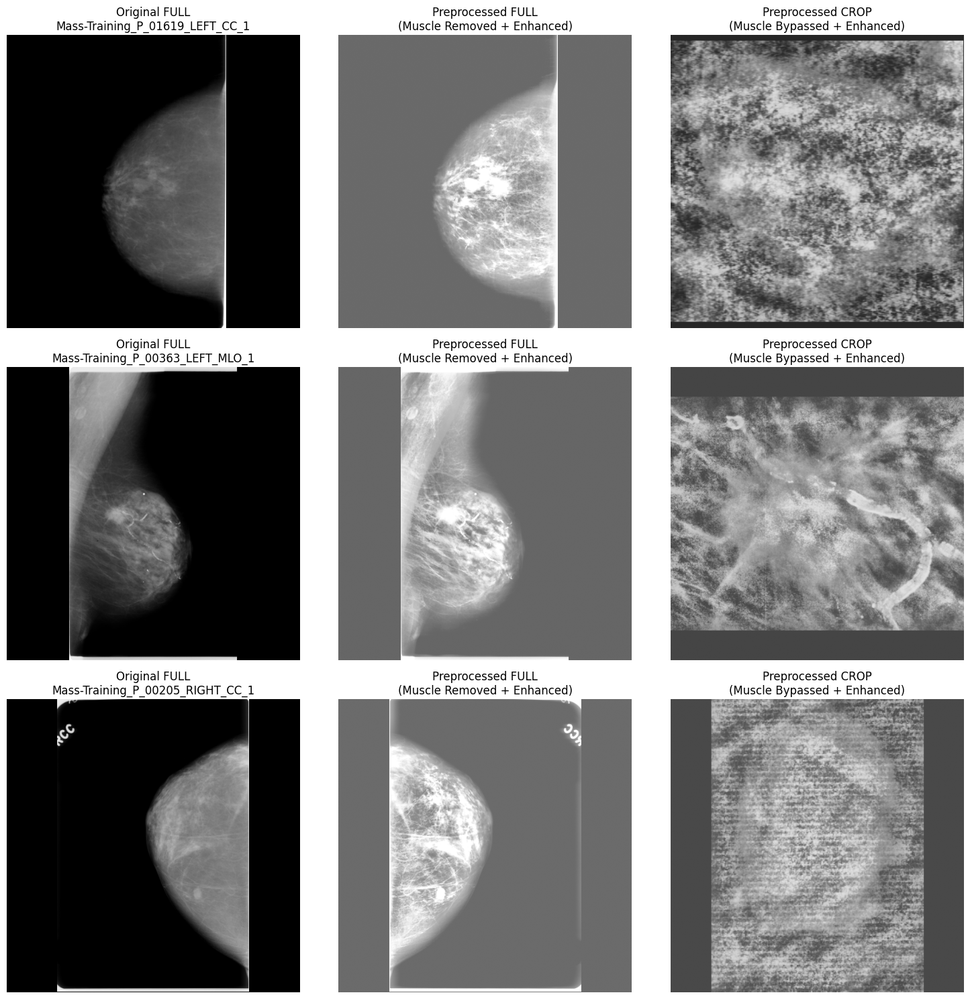

In [5]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from monai.transforms import MapTransform, Compose, EnsureChannelFirstd

# --- Configuration ---
DATA_DIR = "/kaggle/input/datasets/abdelrahmanelmugh/cbis-ddsm-512-full1-wm/CBIS-DDSM-512-FULL1/CBIS-DDSM-512-FULL1" 
CSV_PATH = "CBIS_Master_Index_Clean.csv"      
RANDOM_SEED = 42

# ==============================================================================
# 1. Custom MONAI Dictionary Transforms
# ==============================================================================

class ConditionalFlipd(MapTransform):
    def __init__(self, keys, id_key="patient_id"):
        super().__init__(keys)
        self.id_key = id_key

    def __call__(self, data):
        d = dict(data)
        patient_id = d[self.id_key]
        if "_RIGHT_" in patient_id:
            for key in self.keys:
                d[key] = cv2.flip(d[key], 1)
        return d


class PectoralRemovalMLOd(MapTransform):
    def __init__(self, keys, id_key="patient_id"):
        super().__init__(keys)
        self.id_key = id_key

    def __call__(self, data):
        d = dict(data)
        patient_id = d[self.id_key]
        
        for key in self.keys:
            img = d[key]
            
            # AUTOMATIC BYPASS: CC views or images smaller than 1500px (Crops)
            if "_CC_" in patient_id or img.shape[0] < 1500:
                continue
                
            img_8u = (img / 256).astype(np.uint8)
            _, binary = cv2.threshold(img_8u, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            
            h, w = binary.shape
            flood_mask = np.zeros((h + 2, w + 2), np.uint8)
            cv2.floodFill(binary, flood_mask, (0, 0), 255)
            
            pectoral_region = flood_mask[1:-1, 1:-1]
            d[key] = np.where(pectoral_region == 1, 0, img)
            
        return d


class CLAHE16Bitd(MapTransform):
    def __init__(self, keys, clip_limit=2.0, tile_grid_size=(8, 8)):
        super().__init__(keys)
        self.clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)

    def __call__(self, data):
        d = dict(data)
        for key in self.keys:
            d[key] = self.clahe.apply(d[key].astype(np.uint16))
        return d


class ForegroundZScored(MapTransform):
    def __call__(self, data):
        d = dict(data)
        for key in self.keys:
            img = d[key].astype(np.float32)
            mask = img > 0
            if mask.sum() > 0:
                img[mask] = (img[mask] - img[mask].mean()) / (img[mask].std() + 1e-8)
            d[key] = img
        return d


# ==============================================================================
# 2. Main Execution (Testing Both Full and Crop)
# ==============================================================================

def main():
    df = pd.read_csv(CSV_PATH)
    train_df = df[df['Patient_Split'] == 'Train'].sample(3, random_state=RANDOM_SEED)

    pipeline = Compose([
        ConditionalFlipd(keys=["image"]), 
        PectoralRemovalMLOd(keys=["image"]),     
        CLAHE16Bitd(keys=["image"]),             
        ForegroundZScored(keys=["image"]),       
        EnsureChannelFirstd(keys=["image"], channel_dim="no_channel")
    ])

    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    
    for idx, (_, row) in enumerate(train_df.iterrows()):
        patient_id = row['PatientID']
        
        # Load BOTH images
        full_path = os.path.join(DATA_DIR, row['Full_Path'])
        crop_path = os.path.join(DATA_DIR, row['Crop_Path'])
        
        raw_full = cv2.imread(full_path, cv2.IMREAD_UNCHANGED)
        raw_crop = cv2.imread(crop_path, cv2.IMREAD_UNCHANGED)

        # Process FULL image
        full_dict = pipeline({"image": raw_full, "patient_id": patient_id})
        proc_full = full_dict["image"].squeeze()

        # Process CROP image
        crop_dict = pipeline({"image": raw_crop, "patient_id": patient_id})
        proc_crop = crop_dict["image"].squeeze()

        # Visualization
        raw_full_display = raw_full.astype(np.float32) / 65535.0

        axes[idx, 0].imshow(raw_full_display, cmap='gray')
        axes[idx, 0].set_title(f"Original FULL\n{patient_id}")
        axes[idx, 0].axis('off')

        axes[idx, 1].imshow(proc_full, cmap='gray', vmin=-3, vmax=3)
        axes[idx, 1].set_title("Preprocessed FULL\n(Muscle Removed + Enhanced)")
        axes[idx, 1].axis('off')

        axes[idx, 2].imshow(proc_crop, cmap='gray', vmin=-3, vmax=3)
        axes[idx, 2].set_title("Preprocessed CROP\n(Muscle Bypassed + Enhanced)")
        axes[idx, 2].axis('off')

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

In [6]:
!pip install segmentation-models-pytorch monai timm -q


In [7]:
import os
import cv2
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from monai.transforms import Compose, EnsureChannelFirstd
import warnings
warnings.filterwarnings("ignore")


class CBISDDSMDataset(Dataset):
    def __init__(self, df, data_dir, transform=None):
        self.df       = df.reset_index(drop=True)
        self.data_dir = data_dir
        self.transform = transform

    def __len__(self):
        # Strictly 1-to-1 mapping. No dataset doubling.
        return len(self.df)

    def __getitem__(self, idx):
        row          = self.df.iloc[idx]
        patient_id   = row['PatientID']
        
        # Load ONLY the Full image and its corresponding Mask
        img_path   = os.path.join(self.data_dir, row['Full_Path'])
        roi_path   = os.path.join(self.data_dir, row['ROI_Path'])
        
        image = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
        roi   = cv2.imread(roi_path, cv2.IMREAD_UNCHANGED)

        if image is None:
            raise FileNotFoundError(f"Could not load image: {img_path}")
        if roi is None:
            raise FileNotFoundError(f"Could not load ROI: {roi_path}")

        roi = (roi > 0).astype(np.float32) # Binarize mask

        # Build MONAI Dictionary
        data_dict = {
            "image":      image,
            "roi":        roi,
            "patient_id": patient_id,
            "image_type": "FULL", # Hardcoded to FULL to bypass any crop logic
            "label":      np.array([row['Label']], dtype=np.float32)
        }

        # Apply Pipeline
        if self.transform:
            data_dict = self.transform(data_dict)

        img_tensor   = data_dict["image"].detach().clone().to(torch.float32)
        roi_tensor   = data_dict["roi"].detach().clone().to(torch.float32)
        label_tensor = torch.tensor(data_dict["label"], dtype=torch.float32)

        return {"image": img_tensor, "roi": roi_tensor, "label": label_tensor}

# ==========================================================
# Quick Test to Prove it Works
# ==========================================================
if __name__ == "__main__":
    DATA_DIR = "/kaggle/input/datasets/abdelrahmanelmugh/cbis-ddsm-512-full1-wm/CBIS-DDSM-512-FULL1/CBIS-DDSM-512-FULL1"
    df = pd.read_csv("CBIS_Master_Index_Clean.csv").head(2) # Take 2 patients
    print(f"Original CSV Rows: {len(df)}")
    
    test_transform = Compose([
        EnsureChannelFirstd(keys=["image", "roi"], channel_dim="no_channel")
    ])
    
    standard_dataset = CBISDDSMDataset(df, DATA_DIR, transform=test_transform)
    print(f"Standard Dataset Length: {len(standard_dataset)} (Strict 1-to-1 mapping)\n")
    
    # Iterate through the dataset
    for i in range(len(standard_dataset)):
        sample = standard_dataset[i]
        # We handle 'image_type' safely here in case it gets stripped by transformations
        print(f"Index {i}: {df.iloc[i]['PatientID']} | Image Shape: {sample['image'].shape} | Mask Shape: {sample['roi'].shape}")

Original CSV Rows: 2
Standard Dataset Length: 2 (Strict 1-to-1 mapping)

Index 0: Mass-Test_P_00016_LEFT_CC_1 | Image Shape: torch.Size([1, 512, 512]) | Mask Shape: torch.Size([1, 512, 512])
Index 1: Mass-Test_P_00016_LEFT_MLO_1 | Image Shape: torch.Size([1, 512, 512]) | Mask Shape: torch.Size([1, 512, 512])


In [8]:
!pip install segmentation-models-pytorch monai timm -q

In [9]:
# ==============================================================================
# EXP-05 — Staged Training (Phase 1: Seg Only -> Phase 2: MTL)
# ==============================================================================

import os
import cv2
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
import monai
import segmentation_models_pytorch as smp
from torch.utils.data import Dataset, DataLoader
from monai.transforms import MapTransform, Compose, EnsureChannelFirstd, RandFlipd, RandRotated
from monai.losses import TverskyLoss
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix
from tqdm import tqdm

# --- Configuration ---
DATA_DIR      = "/kaggle/input/datasets/abdelrahmanelmugh/cbis-ddsm-512-full1-wm/CBIS-DDSM-512-FULL1/CBIS-DDSM-512-FULL1"
CSV_PATH      = "/kaggle/working/CBIS_Master_Index_Clean.csv"
BATCH_SIZE    = 4
MAX_EPOCHS    = 30
LEARNING_RATE = 1e-4
PATIENCE      = 10
RANDOM_SEED   = 42
DEVICE        = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

# ==============================================================================
# 1. Transforms
# ==============================================================================

class ConditionalFlipd(MapTransform):
    def __init__(self, keys, id_key="patient_id"):
        super().__init__(keys)
        self.id_key = id_key

    def __call__(self, data):
        d = dict(data)
        if "RIGHT" in d[self.id_key].upper():
            for key in self.keys:
                d[key] = cv2.flip(d[key], 1)
        return d

class PectoralRemovalMLOd(MapTransform):
    def __init__(self, keys, id_key="patient_id"):
        super().__init__(keys)
        self.id_key = id_key

    def __call__(self, data):
        d = dict(data)
        if "_CC" in d[self.id_key].upper() or d.get("image_type") == "CROP":
            return d
        for key in self.keys:
            img    = d[key]
            img_8u = (img / 256).astype(np.uint8)
            _, binary = cv2.threshold(img_8u, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            h, w   = binary.shape
            flood_mask = np.zeros((h + 2, w + 2), np.uint8)
            cv2.floodFill(binary, flood_mask, (0, 0), 255)
            pectoral = flood_mask[1:-1, 1:-1]
            d[key]  = np.where(pectoral == 1, 0, img)
        return d

class CLAHE16Bitd(MapTransform):
    def __init__(self, keys, clip_limit=4.0, tile_grid_size=(8, 8)):
        super().__init__(keys)
        self.clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)

    def __call__(self, data):
        d = dict(data)
        for key in self.keys:
            d[key] = self.clahe.apply(d[key].astype(np.uint16))
        return d

class ForegroundZScored(MapTransform):
    def __call__(self, data):
        d = dict(data)
        for key in self.keys:
            img  = d[key].astype(np.float32)
            mask = img > 0
            if mask.sum() > 0:
                img[mask] = (img[mask] - img[mask].mean()) / (img[mask].std() + 1e-8)
            d[key] = img
        return d

def build_val_pipeline():
    return Compose([
        ConditionalFlipd(keys=["image", "roi"]),
        PectoralRemovalMLOd(keys=["image"]),
        CLAHE16Bitd(keys=["image"]),
        ForegroundZScored(keys=["image"]),
        EnsureChannelFirstd(keys=["image", "roi"], channel_dim="no_channel"),
    ])

def build_train_pipeline():
    return Compose([
        ConditionalFlipd(keys=["image", "roi"]),
        PectoralRemovalMLOd(keys=["image"]),
        CLAHE16Bitd(keys=["image"]),
        ForegroundZScored(keys=["image"]),
        EnsureChannelFirstd(keys=["image", "roi"], channel_dim="no_channel"),
        RandFlipd(keys=["image", "roi"], prob=0.5, spatial_axis=1),
        RandRotated(keys=["image", "roi"], range_x=15 * math.pi / 180, prob=0.5, mode=["bilinear", "nearest"], padding_mode="zeros"),
    ])

train_pipeline = build_train_pipeline()
val_pipeline   = build_val_pipeline()

# ==============================================================================
# 2. Dataset (Strictly 1-to-1, No Crops)
# ==============================================================================

class CBISDDSMDataset(Dataset):
    def __init__(self, df, data_dir, transform=None):
        self.df       = df.reset_index(drop=True)
        self.data_dir = data_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row          = self.df.iloc[idx]
        patient_id   = row['PatientID']

        img_path   = os.path.join(self.data_dir, row['Full_Path'])
        roi_path   = os.path.join(self.data_dir, row['ROI_Path'])

        img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
        roi = cv2.imread(roi_path, cv2.IMREAD_UNCHANGED)

        if img is None:
            raise FileNotFoundError(f"Could not load image: {img_path}")
        if roi is None:
            raise FileNotFoundError(f"Could not load ROI: {roi_path}")

        roi = (roi > 0).astype(np.float32)

        data_dict = {
            "image":      img,
            "roi":        roi,
            "patient_id": patient_id,
            "image_type": "FULL",
            "label":      np.array([row['Label']], dtype=np.float32),
        }

        if self.transform:
            data_dict = self.transform(data_dict)

        img_tensor   = data_dict["image"].detach().clone().to(torch.float32)
        roi_tensor   = data_dict["roi"].detach().clone().to(torch.float32)
        label_tensor = torch.tensor(data_dict["label"], dtype=torch.float32)

        return {"image": img_tensor, "roi": roi_tensor, "label": label_tensor}

# ==============================================================================
# 3. Model & Custom Loss
# ==============================================================================

class ChannelAttention(nn.Module):
    def __init__(self, in_planes, ratio=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.fc1      = nn.Conv2d(in_planes, in_planes // ratio, 1, bias=False)
        self.relu     = nn.ReLU()
        self.fc2      = nn.Conv2d(in_planes // ratio, in_planes, 1, bias=False)
        self.sigmoid  = nn.Sigmoid()

    def forward(self, x):
        avg = self.fc2(self.relu(self.fc1(self.avg_pool(x))))
        mx  = self.fc2(self.relu(self.fc1(self.max_pool(x))))
        return self.sigmoid(avg + mx)

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super().__init__()
        self.conv    = nn.Conv2d(2, 1, kernel_size, padding=kernel_size // 2, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg = torch.mean(x, dim=1, keepdim=True)
        mx  = torch.max(x,  dim=1, keepdim=True)[0]
        return self.sigmoid(self.conv(torch.cat([avg, mx], dim=1)))

class CBAM(nn.Module):
    def __init__(self, in_planes):
        super().__init__()
        self.ca = ChannelAttention(in_planes)
        self.sa = SpatialAttention()

    def forward(self, x):
        x = x * self.ca(x)
        x = x * self.sa(x)
        return x

class MTL_EfficientUNetPlusPlus(nn.Module):
    def __init__(self):
        super().__init__()
        self.smp_base = smp.UnetPlusPlus(
            encoder_name="tu-tf_efficientnet_b0",
            encoder_weights="imagenet",
            in_channels=1,
            classes=1,
            activation=None,
        )
        bottleneck_ch = self.smp_base.encoder.out_channels[-1]
        self.classification_branch = nn.Sequential(
            CBAM(in_planes=bottleneck_ch),
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(bottleneck_ch, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, 1),
        )

    def forward(self, x):
        features    = self.smp_base.encoder(x)
        seg_mask    = self.smp_base.segmentation_head(self.smp_base.decoder(features))
        class_score = self.classification_branch(features[-1])
        return seg_mask, class_score

class BinaryFocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0):
        super(BinaryFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, logits, targets):
        bce_loss = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        pt = torch.exp(-bce_loss) 
        focal_loss = self.alpha * (1 - pt) ** self.gamma * bce_loss
        return focal_loss.mean()

# ==============================================================================
# 4. Helpers
# ==============================================================================

def calc_dice(pred_logits, target, smooth=1e-5):
    pred         = (torch.sigmoid(pred_logits) > 0.5).float()
    intersection = (pred * target).sum(dim=(1, 2, 3))
    union        = pred.sum(dim=(1, 2, 3)) + target.sum(dim=(1, 2, 3))
    return ((2. * intersection + smooth) / (union + smooth)).mean().item()

# ==============================================================================
# 5. Main
# ==============================================================================

def run_exp_05():
    set_seed(RANDOM_SEED)
    print(f"--- EXP-05: Staged Training on {DEVICE} ---")

    # Splits
    df       = pd.read_csv(CSV_PATH)
    train_df = df[df['Patient_Split'] == 'Train'].reset_index(drop=True)
    val_df   = df[df['Patient_Split'] == 'Val'].reset_index(drop=True)
    test_df  = df[df['Patient_Split'] == 'Test'].reset_index(drop=True)

    # Datasets & Loaders
    train_dataset = CBISDDSMDataset(train_df, DATA_DIR, train_pipeline)
    val_dataset   = CBISDDSMDataset(val_df,   DATA_DIR, val_pipeline)
    test_dataset  = CBISDDSMDataset(test_df,  DATA_DIR, val_pipeline)

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
    val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
    test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

    # Model
    model         = MTL_EfficientUNetPlusPlus().to(DEVICE)
    
    # --- CHANGED: Using Tversky for Segmentation ---
    criterion_seg = TverskyLoss(alpha=0.3, beta=0.7, sigmoid=True)
    criterion_cls = BinaryFocalLoss(alpha=0.25, gamma=2.0)
    
    optimizer     = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=1e-5)
    scheduler     = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=5)

    best_val_dice     = 0.0
    epochs_no_improve = 0
    history = {'train_loss': [], 'val_loss': [], 'val_dice': [], 'val_auc': []}

    # INITIAL FREEZE: Phase 1 setup
    for param in model.classification_branch.parameters():
        param.requires_grad = False

    # Training
    for epoch in range(MAX_EPOCHS):
        
        # --- PHASE CONTROL ---
        if epoch == 0:
            print("\n--- PHASE 1: Segmentation Only (Epochs 1-10) ---")
            print("Classification branch is FROZEN.")
        elif epoch == 10:
            print("\n--- PHASE 2: Combined MTL (Epochs 11-30) ---")
            print("Unfreezing classification branch...")
            for param in model.classification_branch.parameters():
                param.requires_grad = True
            epochs_no_improve = 0  # reset patience for Phase 2
        model.train()
        train_loss = train_dice_loss = train_bce_loss = 0.0

        loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{MAX_EPOCHS} [Train]")
        for batch in loop:
            images = batch["image"].to(DEVICE)
            masks  = batch["roi"].to(DEVICE)
            labels = batch["label"].to(DEVICE)

            optimizer.zero_grad()
            pred_masks, pred_logits = model(images)

            l_seg = criterion_seg(pred_masks, masks)
            l_cls = criterion_cls(pred_logits, labels)
            
            # --- PHASE LOSS LOGIC ---
            if epoch < 10:
                loss = l_seg
            else:
                loss = 0.7 * l_seg + 0.3 * l_cls

            loss.backward()
            optimizer.step()

            train_loss      += loss.item()
            train_dice_loss += l_seg.item()
            train_bce_loss  += l_cls.item()
            
            if epoch < 10:
                loop.set_postfix(Loss=f"{loss.item():.4f}", Tversky=f"{l_seg.item():.4f}", Focal="N/A")
            else:
                loop.set_postfix(Loss=f"{loss.item():.4f}", Tversky=f"{l_seg.item():.4f}", Focal=f"{l_cls.item():.4f}")

        # Validation
        model.eval()
        val_loss = val_dice_sum = 0.0
        all_labels, all_preds = [], []

        with torch.no_grad():
            for batch in val_loader:
                images = batch["image"].to(DEVICE)
                masks  = batch["roi"].to(DEVICE)
                labels = batch["label"].to(DEVICE)

                pred_masks, pred_logits = model(images)
                l_seg = criterion_seg(pred_masks, masks)
                l_cls = criterion_cls(pred_logits, labels)

                if epoch < 10:
                    val_loss += l_seg.item()
                else:
                    val_loss += (0.7 * l_seg + 0.3 * l_cls).item()
                    
                val_dice_sum += calc_dice(pred_masks, masks)
                all_labels.extend(labels.cpu().numpy().flatten())
                all_preds.extend(torch.sigmoid(pred_logits).cpu().numpy().flatten())

        t_len      = len(train_loader)
        v_len      = len(val_loader)
        avg_t_loss = train_loss  / t_len
        avg_v_loss = val_loss    / v_len
        avg_v_dice = val_dice_sum / v_len

        try:
            val_auc = roc_auc_score(all_labels, all_preds)
        except ValueError:
            val_auc = 0.5

        history['train_loss'].append(avg_t_loss)
        history['val_loss'].append(avg_v_loss)
        history['val_dice'].append(avg_v_dice)
        history['val_auc'].append(val_auc)

        phase_lbl = "[P1]" if epoch < 10 else "[P2]"
        print(
            f"Ep {epoch+1:02d}/{MAX_EPOCHS} {phase_lbl} | "
            f"T_Loss: {avg_t_loss:.4f} | V_Loss: {avg_v_loss:.4f} | V_Dice: {avg_v_dice:.4f} | V_AUC: {val_auc:.4f}"
        )

        scheduler.step(avg_v_dice)

        if avg_v_dice > best_val_dice:
            best_val_dice     = avg_v_dice
            epochs_no_improve = 0
            torch.save(model.state_dict(), "best_model_exp05.pth")
            print("  [*] Best model saved.")
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= PATIENCE:
                print(f"\n--- Early stopping at epoch {epoch+1} ---")
                break

    # Test Evaluation
    print("\n--- Final Test Evaluation ---")
    model.load_state_dict(torch.load("/kaggle/working/best_model_exp05.pth", map_location=DEVICE))
    model.eval()

    test_dice_sum = 0.0
    t_labels, t_preds, t_binary = [], [], []

    with torch.no_grad():
        for batch in test_loader:
            images = batch["image"].to(DEVICE)
            masks  = batch["roi"].to(DEVICE)
            labels = batch["label"].to(DEVICE)

            pred_masks, pred_logits = model(images)
            test_dice_sum += calc_dice(pred_masks, masks)

            probs = torch.sigmoid(pred_logits).cpu().numpy().flatten()
            t_preds.extend(probs)
            t_binary.extend((probs > 0.5).astype(int))
            t_labels.extend(labels.cpu().numpy().flatten())

    final_dice = test_dice_sum / len(test_loader)
    final_auc  = roc_auc_score(t_labels, t_preds)
    final_acc  = accuracy_score(t_labels, t_binary)
    cm         = confusion_matrix(t_labels, t_binary)

    print(f"\nTest Dice:     {final_dice:.4f}  (Target: >0.75)")
    print(f"Test AUC:      {final_auc:.4f}  (Target: >0.85)")
    print(f"Test Accuracy: {final_acc:.4f}")
    print(f"Confusion Matrix:\n{cm}")

run_exp_05()

--- EXP-05: Staged Training on cuda ---


model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

Unexpected keys (bn2.num_batches_tracked, bn2.bias, bn2.running_mean, bn2.running_var, bn2.weight, classifier.bias, classifier.weight, conv_head.weight) found while loading pretrained weights. This may be expected if model is being adapted.



--- PHASE 1: Segmentation Only (Epochs 1-10) ---
Classification branch is FROZEN.


Epoch 1/30 [Train]: 100%|██████████| 237/237 [01:13<00:00,  3.23it/s, Focal=N/A, Loss=0.7142, Tversky=0.7142]


Ep 01/30 [P1] | T_Loss: 0.9556 | V_Loss: 0.9065 | V_Dice: 0.1911 | V_AUC: 0.4823
  [*] Best model saved.


Epoch 2/30 [Train]: 100%|██████████| 237/237 [01:14<00:00,  3.17it/s, Focal=N/A, Loss=0.5020, Tversky=0.5020]


Ep 02/30 [P1] | T_Loss: 0.7767 | V_Loss: 0.6559 | V_Dice: 0.3842 | V_AUC: 0.4565
  [*] Best model saved.


Epoch 3/30 [Train]: 100%|██████████| 237/237 [01:16<00:00,  3.09it/s, Focal=N/A, Loss=0.9997, Tversky=0.9997]


Ep 03/30 [P1] | T_Loss: 0.5916 | V_Loss: 0.5417 | V_Dice: 0.4712 | V_AUC: 0.4704
  [*] Best model saved.


Epoch 4/30 [Train]: 100%|██████████| 237/237 [01:17<00:00,  3.04it/s, Focal=N/A, Loss=0.2315, Tversky=0.2315]


Ep 04/30 [P1] | T_Loss: 0.5123 | V_Loss: 0.4766 | V_Dice: 0.5217 | V_AUC: 0.4679
  [*] Best model saved.


Epoch 5/30 [Train]: 100%|██████████| 237/237 [01:18<00:00,  3.02it/s, Focal=N/A, Loss=0.2473, Tversky=0.2473]


Ep 05/30 [P1] | T_Loss: 0.4803 | V_Loss: 0.4396 | V_Dice: 0.5259 | V_AUC: 0.4961
  [*] Best model saved.


Epoch 6/30 [Train]: 100%|██████████| 237/237 [01:18<00:00,  3.01it/s, Focal=N/A, Loss=0.2986, Tversky=0.2986]


Ep 06/30 [P1] | T_Loss: 0.4598 | V_Loss: 0.4416 | V_Dice: 0.5352 | V_AUC: 0.5005
  [*] Best model saved.


Epoch 7/30 [Train]: 100%|██████████| 237/237 [01:18<00:00,  3.00it/s, Focal=N/A, Loss=1.0000, Tversky=1.0000]


Ep 07/30 [P1] | T_Loss: 0.4494 | V_Loss: 0.4428 | V_Dice: 0.5362 | V_AUC: 0.5197
  [*] Best model saved.


Epoch 8/30 [Train]: 100%|██████████| 237/237 [01:18<00:00,  3.00it/s, Focal=N/A, Loss=0.3496, Tversky=0.3496]


Ep 08/30 [P1] | T_Loss: 0.4264 | V_Loss: 0.4371 | V_Dice: 0.5400 | V_AUC: 0.4694
  [*] Best model saved.


Epoch 9/30 [Train]: 100%|██████████| 237/237 [01:19<00:00,  2.98it/s, Focal=N/A, Loss=0.4523, Tversky=0.4523]


Ep 09/30 [P1] | T_Loss: 0.4086 | V_Loss: 0.4528 | V_Dice: 0.5248 | V_AUC: 0.5782


Epoch 10/30 [Train]: 100%|██████████| 237/237 [01:18<00:00,  3.01it/s, Focal=N/A, Loss=0.4518, Tversky=0.4518]


Ep 10/30 [P1] | T_Loss: 0.4039 | V_Loss: 0.4431 | V_Dice: 0.5337 | V_AUC: 0.4752

--- PHASE 2: Combined MTL (Epochs 11-30) ---
Unfreezing classification branch...


Epoch 11/30 [Train]: 100%|██████████| 237/237 [01:18<00:00,  3.00it/s, Focal=0.0497, Loss=0.0990, Tversky=0.1201]


Ep 11/30 [P2] | T_Loss: 0.2925 | V_Loss: 0.3213 | V_Dice: 0.5502 | V_AUC: 0.5607
  [*] Best model saved.


Epoch 12/30 [Train]: 100%|██████████| 237/237 [01:19<00:00,  2.99it/s, Focal=0.0362, Loss=0.2001, Tversky=0.2703]


Ep 12/30 [P2] | T_Loss: 0.2882 | V_Loss: 0.3225 | V_Dice: 0.5505 | V_AUC: 0.6034
  [*] Best model saved.


Epoch 13/30 [Train]: 100%|██████████| 237/237 [01:18<00:00,  3.00it/s, Focal=0.0438, Loss=0.2852, Tversky=0.3887]


Ep 13/30 [P2] | T_Loss: 0.2768 | V_Loss: 0.3038 | V_Dice: 0.5352 | V_AUC: 0.6377


Epoch 14/30 [Train]: 100%|██████████| 237/237 [01:18<00:00,  3.00it/s, Focal=0.0401, Loss=0.0989, Tversky=0.1241]


Ep 14/30 [P2] | T_Loss: 0.2677 | V_Loss: 0.2997 | V_Dice: 0.5562 | V_AUC: 0.6479
  [*] Best model saved.


Epoch 15/30 [Train]: 100%|██████████| 237/237 [01:18<00:00,  3.00it/s, Focal=0.0435, Loss=0.2800, Tversky=0.3814]


Ep 15/30 [P2] | T_Loss: 0.2713 | V_Loss: 0.3128 | V_Dice: 0.5413 | V_AUC: 0.7047


Epoch 16/30 [Train]: 100%|██████████| 237/237 [01:19<00:00,  3.00it/s, Focal=0.0360, Loss=0.2295, Tversky=0.3124]


Ep 16/30 [P2] | T_Loss: 0.2684 | V_Loss: 0.2993 | V_Dice: 0.5648 | V_AUC: 0.6831
  [*] Best model saved.


Epoch 17/30 [Train]: 100%|██████████| 237/237 [01:19<00:00,  3.00it/s, Focal=0.0470, Loss=0.1435, Tversky=0.1849]


Ep 17/30 [P2] | T_Loss: 0.2727 | V_Loss: 0.3018 | V_Dice: 0.5454 | V_AUC: 0.6979


Epoch 18/30 [Train]: 100%|██████████| 237/237 [01:18<00:00,  3.00it/s, Focal=0.0403, Loss=0.2753, Tversky=0.3760]


Ep 18/30 [P2] | T_Loss: 0.2566 | V_Loss: 0.3195 | V_Dice: 0.5368 | V_AUC: 0.7023


Epoch 19/30 [Train]: 100%|██████████| 237/237 [01:18<00:00,  3.00it/s, Focal=0.0525, Loss=0.6411, Tversky=0.8934]


Ep 19/30 [P2] | T_Loss: 0.2590 | V_Loss: 0.3009 | V_Dice: 0.5511 | V_AUC: 0.7426


Epoch 20/30 [Train]: 100%|██████████| 237/237 [01:19<00:00,  2.99it/s, Focal=0.0353, Loss=0.1771, Tversky=0.2379]


Ep 20/30 [P2] | T_Loss: 0.2644 | V_Loss: 0.3017 | V_Dice: 0.5555 | V_AUC: 0.7064


Epoch 21/30 [Train]: 100%|██████████| 237/237 [01:20<00:00,  2.96it/s, Focal=0.0453, Loss=0.2496, Tversky=0.3372]


Ep 21/30 [P2] | T_Loss: 0.2470 | V_Loss: 0.3382 | V_Dice: 0.5197 | V_AUC: 0.6727


Epoch 22/30 [Train]: 100%|██████████| 237/237 [01:19<00:00,  2.99it/s, Focal=0.0338, Loss=0.7101, Tversky=1.0000]


Ep 22/30 [P2] | T_Loss: 0.2545 | V_Loss: 0.3012 | V_Dice: 0.5495 | V_AUC: 0.7030


Epoch 23/30 [Train]: 100%|██████████| 237/237 [01:19<00:00,  2.99it/s, Focal=0.0494, Loss=0.1020, Tversky=0.1246]


Ep 23/30 [P2] | T_Loss: 0.2409 | V_Loss: 0.3063 | V_Dice: 0.5400 | V_AUC: 0.6809


Epoch 24/30 [Train]: 100%|██████████| 237/237 [01:19<00:00,  2.99it/s, Focal=0.0281, Loss=0.1621, Tversky=0.2195]


Ep 24/30 [P2] | T_Loss: 0.2392 | V_Loss: 0.3258 | V_Dice: 0.5313 | V_AUC: 0.6923


Epoch 25/30 [Train]: 100%|██████████| 237/237 [01:19<00:00,  2.99it/s, Focal=0.0530, Loss=0.7159, Tversky=1.0000]


Ep 25/30 [P2] | T_Loss: 0.2314 | V_Loss: 0.3107 | V_Dice: 0.5501 | V_AUC: 0.7091


Epoch 26/30 [Train]: 100%|██████████| 237/237 [01:19<00:00,  2.99it/s, Focal=0.0505, Loss=0.7151, Tversky=1.0000]


Ep 26/30 [P2] | T_Loss: 0.2296 | V_Loss: 0.3095 | V_Dice: 0.5522 | V_AUC: 0.7205

--- Early stopping at epoch 26 ---

--- Final Test Evaluation ---

Test Dice:     0.5277  (Target: >0.75)
Test AUC:      0.7358  (Target: >0.85)
Test Accuracy: 0.6552
Confusion Matrix:
[[81 40]
 [50 90]]


In [10]:
# ==============================================================================
# EXP-07 — Fine-Tune on Crops (Staged) [FIXED DATASET BUG]
# ==============================================================================

class CropCBISDDSMDataset(Dataset):
    def __init__(self, df, data_dir, transform=None):
        self.df       = df.reset_index(drop=True)
        self.data_dir = data_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        patient_id = row['PatientID']

        img_path = os.path.join(self.data_dir, row['Crop_Path'])
        roi_path = os.path.join(self.data_dir, row['Crop_ROI_Path'])

        img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
        roi = cv2.imread(roi_path, cv2.IMREAD_UNCHANGED)

        if img is None: raise FileNotFoundError(f"Could not load image: {img_path}")
        if roi is None: raise FileNotFoundError(f"Could not load ROI: {roi_path}")

        roi = (roi > 0).astype(np.float32)

        data_dict = {
            "image":      img,
            "roi":        roi,
            "patient_id": patient_id,
            "image_type": "CROP",  # <--- CRITICAL FIX: Prevents pectoral removal from erasing the tumor
            "label":      np.array([row['Label']], dtype=np.float32),
        }

        if self.transform:
            data_dict = self.transform(data_dict)

        img_tensor   = torch.tensor(data_dict["image"], dtype=torch.float32)
        roi_tensor   = torch.tensor(data_dict["roi"],   dtype=torch.float32)
        label_tensor = torch.tensor(data_dict["label"], dtype=torch.float32)

        return {"image": img_tensor, "roi": roi_tensor, "label": label_tensor}

def run_exp_07_finetune():
    set_seed(RANDOM_SEED)
    print(f"--- EXP-07: Fine-Tuning on Crops ({DEVICE}) ---")

    df = pd.read_csv(CSV_PATH)
    crop_df = df.dropna(subset=['Crop_Path', 'Crop_ROI_Path']).copy()

    train_df = crop_df[crop_df['Patient_Split'] == 'Train'].reset_index(drop=True)
    val_df   = crop_df[crop_df['Patient_Split'] == 'Val'].reset_index(drop=True)
    test_df  = crop_df[crop_df['Patient_Split'] == 'Test'].reset_index(drop=True)

    # USING THE FIXED CROP DATASET
    train_dataset = CropCBISDDSMDataset(train_df, DATA_DIR, val_pipeline)
    val_dataset   = CropCBISDDSMDataset(val_df,   DATA_DIR, val_pipeline)
    test_dataset  = CropCBISDDSMDataset(test_df,  DATA_DIR, val_pipeline)

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
    val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
    test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

    model = MTL_EfficientUNetPlusPlus().to(DEVICE)
    try:
        model.load_state_dict(torch.load("/kaggle/working/best_model_exp05.pth", map_location=DEVICE))
        print("Successfully loaded 'best_model_exp05.pth' from 4th run.")
    except Exception as e:
        print(f"Error loading base weights: {e}. Aborting.")
        return

    criterion_seg = TverskyLoss(alpha=0.3, beta=0.7, sigmoid=True)
    criterion_cls = BinaryFocalLoss(alpha=0.25, gamma=2.0)
    optimizer     = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=1e-5)

    best_val_dice     = 0.0
    epochs_no_improve = 0

    for param in model.smp_base.encoder.parameters():
        param.requires_grad = False

    for epoch in range(MAX_EPOCHS):
        if epoch == 0:
            print("\n--- PHASE 1: Decoder/Head Only on Crops (Epochs 1-7) ---")
        elif epoch == 7:
            print("\n--- PHASE 2: Full Network Fine-tuning (Epochs 8-30) ---")
            for param in model.smp_base.encoder.parameters(): param.requires_grad = True
            for g in optimizer.param_groups: g['lr'] = 1e-5
            epochs_no_improve = 0 

        model.train()
        train_loss = 0.0
        loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{MAX_EPOCHS} [Train]")
        
        for batch in loop:
            images, masks, labels = batch["image"].to(DEVICE), batch["roi"].to(DEVICE), batch["label"].to(DEVICE)
            optimizer.zero_grad()
            pred_masks, pred_logits = model(images)
            l_seg = criterion_seg(pred_masks, masks)
            l_cls = criterion_cls(pred_logits, labels)
            loss  = 0.7 * l_seg + 0.3 * l_cls
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            loop.set_postfix(Loss=f"{loss.item():.4f}")

        model.eval()
        val_dice_sum = 0.0
        with torch.no_grad():
            for batch in val_loader:
                images, masks = batch["image"].to(DEVICE), batch["roi"].to(DEVICE)
                pred_masks, _ = model(images)
                val_dice_sum += calc_dice(pred_masks, masks)

        avg_v_dice = val_dice_sum / len(val_loader)
        phase_lbl = "[P1]" if epoch < 7 else "[P2]"
        print(f"Ep {epoch+1:02d}/{MAX_EPOCHS} {phase_lbl} | V_Dice: {avg_v_dice:.4f}")

        if avg_v_dice > best_val_dice:
            best_val_dice = avg_v_dice
            epochs_no_improve = 0
            torch.save(model.state_dict(), "best_model_finetuned.pth")
            print("  [*] Best finetuned model saved.")
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= PATIENCE:
                print(f"\n--- Early stopping at epoch {epoch+1} ---")
                break

run_exp_07_finetune()

--- EXP-07: Fine-Tuning on Crops (cuda) ---


Unexpected keys (bn2.num_batches_tracked, bn2.bias, bn2.running_mean, bn2.running_var, bn2.weight, classifier.bias, classifier.weight, conv_head.weight) found while loading pretrained weights. This may be expected if model is being adapted.


Successfully loaded 'best_model_exp05.pth' from 4th run.

--- PHASE 1: Decoder/Head Only on Crops (Epochs 1-7) ---


Epoch 1/30 [Train]: 100%|██████████| 237/237 [00:52<00:00,  4.52it/s, Loss=0.7050]


Ep 01/30 [P1] | V_Dice: 0.0125
  [*] Best finetuned model saved.


Epoch 2/30 [Train]: 100%|██████████| 237/237 [00:52<00:00,  4.52it/s, Loss=0.7117]


Ep 02/30 [P1] | V_Dice: 0.0181
  [*] Best finetuned model saved.


Epoch 3/30 [Train]: 100%|██████████| 237/237 [00:52<00:00,  4.53it/s, Loss=0.7152]


Ep 03/30 [P1] | V_Dice: 0.0165


Epoch 4/30 [Train]: 100%|██████████| 237/237 [00:52<00:00,  4.52it/s, Loss=0.6278]


Ep 04/30 [P1] | V_Dice: 0.0164


Epoch 5/30 [Train]: 100%|██████████| 237/237 [00:54<00:00,  4.38it/s, Loss=0.7084]


Ep 05/30 [P1] | V_Dice: 0.0143


Epoch 6/30 [Train]: 100%|██████████| 237/237 [00:53<00:00,  4.43it/s, Loss=0.7105]


Ep 06/30 [P1] | V_Dice: 0.0168


Epoch 7/30 [Train]: 100%|██████████| 237/237 [00:53<00:00,  4.41it/s, Loss=0.7177]


Ep 07/30 [P1] | V_Dice: 0.0141

--- PHASE 2: Full Network Fine-tuning (Epochs 8-30) ---


Epoch 8/30 [Train]: 100%|██████████| 237/237 [01:13<00:00,  3.20it/s, Loss=0.7102]


Ep 08/30 [P2] | V_Dice: 0.0175


Epoch 9/30 [Train]: 100%|██████████| 237/237 [01:13<00:00,  3.21it/s, Loss=0.7175]


Ep 09/30 [P2] | V_Dice: 0.0123


Epoch 10/30 [Train]: 100%|██████████| 237/237 [01:13<00:00,  3.22it/s, Loss=0.2563]


Ep 10/30 [P2] | V_Dice: 0.0115


Epoch 11/30 [Train]: 100%|██████████| 237/237 [01:13<00:00,  3.22it/s, Loss=0.4399]


Ep 11/30 [P2] | V_Dice: 0.0087


Epoch 12/30 [Train]: 100%|██████████| 237/237 [01:13<00:00,  3.21it/s, Loss=0.6687]


Ep 12/30 [P2] | V_Dice: 0.0097


Epoch 13/30 [Train]: 100%|██████████| 237/237 [01:13<00:00,  3.22it/s, Loss=0.3609]


Ep 13/30 [P2] | V_Dice: 0.0055


Epoch 14/30 [Train]: 100%|██████████| 237/237 [01:13<00:00,  3.21it/s, Loss=0.5091]


Ep 14/30 [P2] | V_Dice: 0.0060


Epoch 15/30 [Train]: 100%|██████████| 237/237 [01:13<00:00,  3.21it/s, Loss=0.7155]


Ep 15/30 [P2] | V_Dice: 0.0075


Epoch 16/30 [Train]: 100%|██████████| 237/237 [01:13<00:00,  3.21it/s, Loss=0.7074]


Ep 16/30 [P2] | V_Dice: 0.0065


Epoch 17/30 [Train]: 100%|██████████| 237/237 [01:13<00:00,  3.21it/s, Loss=0.4016]


Ep 17/30 [P2] | V_Dice: 0.0051

--- Early stopping at epoch 17 ---


In [11]:
# ==============================================================================
# RUN 5.2 — PATCH 2: EXP-08 Catastrophic Forgetting Recovery
# Loads fine-tuned model, runs short reminder training on full images at low LR.
# ==============================================================================
 
def run_exp_08_recovery():
    set_seed(RANDOM_SEED)
    print(f"--- EXP-08: Forgetting Recovery on Full Images ({DEVICE}) ---")
 
    df       = pd.read_csv(CSV_PATH)
    train_df = df[df['Patient_Split'] == 'Train'].reset_index(drop=True)
    val_df   = df[df['Patient_Split'] == 'Val'].reset_index(drop=True)
    test_df  = df[df['Patient_Split'] == 'Test'].reset_index(drop=True)
 
    # Full image datasets — same as EXP-05
    train_dataset = CBISDDSMDataset(train_df, DATA_DIR, train_pipeline)
    val_dataset   = CBISDDSMDataset(val_df,   DATA_DIR, val_pipeline)
    test_dataset  = CBISDDSMDataset(test_df,  DATA_DIR, val_pipeline)
 
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
    val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
    test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
 
    # Load fine-tuned model as starting point
    model = MTL_EfficientUNetPlusPlus().to(DEVICE)
    model.load_state_dict(torch.load("/kaggle/working/best_model_finetuned.pth", map_location=DEVICE))
    print("Loaded fine-tuned weights: best_model_finetuned.pth")
 
    criterion_seg = TverskyLoss(alpha=0.3, beta=0.7, sigmoid=True)
    criterion_cls = BinaryFocalLoss(alpha=0.25, gamma=2.0)
 
    # Very low LR — gentle reminder, not a full retrain
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-5, weight_decay=1e-5)
 
    RECOVERY_EPOCHS = 7
    RECOVERY_PATIENCE = 5
    best_val_dice     = 0.0
    epochs_no_improve = 0
 
    print(f"Recovery training: {RECOVERY_EPOCHS} max epochs, LR=1e-5, patience={RECOVERY_PATIENCE}")
 
    for epoch in range(RECOVERY_EPOCHS):
        model.train()
        train_loss = 0.0
 
        loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{RECOVERY_EPOCHS} [Recovery]")
        for batch in loop:
            images = batch["image"].to(DEVICE)
            masks  = batch["roi"].to(DEVICE)
            labels = batch["label"].to(DEVICE)
 
            optimizer.zero_grad()
            pred_masks, pred_logits = model(images)
            l_seg = criterion_seg(pred_masks, masks)
            l_cls = criterion_cls(pred_logits, labels)
            loss  = 0.7 * l_seg + 0.3 * l_cls
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            loop.set_postfix(Loss=f"{loss.item():.4f}")
 
        # Validation
        model.eval()
        val_dice_sum = 0.0
        all_labels, all_preds = [], []
 
        with torch.no_grad():
            for batch in val_loader:
                images = batch["image"].to(DEVICE)
                masks  = batch["roi"].to(DEVICE)
                labels = batch["label"].to(DEVICE)
                pred_masks, pred_logits = model(images)
                val_dice_sum += calc_dice(pred_masks, masks)
                all_labels.extend(labels.cpu().numpy().flatten())
                all_preds.extend(torch.sigmoid(pred_logits).cpu().numpy().flatten())
 
        avg_v_dice = val_dice_sum / len(val_loader)
        try:
            val_auc = roc_auc_score(all_labels, all_preds)
        except ValueError:
            val_auc = 0.5
 
        print(f"Ep {epoch+1:02d}/{RECOVERY_EPOCHS} | V_Dice: {avg_v_dice:.4f} | V_AUC: {val_auc:.4f}")
 
        if avg_v_dice > best_val_dice:
            best_val_dice     = avg_v_dice
            epochs_no_improve = 0
            torch.save(model.state_dict(), "best_model_recovered.pth")
            print("  [*] Best recovered model saved.")
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= RECOVERY_PATIENCE:
                print(f"\n--- Early stopping at epoch {epoch+1} ---")
                break
 
    # Final test evaluation
    print("\n--- Final Test Evaluation (Recovered Model) ---")
    model.load_state_dict(torch.load("best_model_recovered.pth", map_location=DEVICE))
    model.eval()
 
    test_dice_sum = 0.0
    t_labels, t_preds, t_binary = [], [], []
 
    with torch.no_grad():
        for batch in test_loader:
            images = batch["image"].to(DEVICE)
            masks  = batch["roi"].to(DEVICE)
            labels = batch["label"].to(DEVICE)
            pred_masks, pred_logits = model(images)
            test_dice_sum += calc_dice(pred_masks, masks)
            probs = torch.sigmoid(pred_logits).cpu().numpy().flatten()
            t_preds.extend(probs)
            t_binary.extend((probs > 0.5).astype(int))
            t_labels.extend(labels.cpu().numpy().flatten())
 
    final_dice = test_dice_sum / len(test_loader)
    final_auc  = roc_auc_score(t_labels, t_preds)
    final_acc  = accuracy_score(t_labels, t_binary)
    cm         = confusion_matrix(t_labels, t_binary)
 
    print(f"\nRecovered Test Dice:     {final_dice:.4f}  (Target: >0.75)")
    print(f"Recovered Test AUC:      {final_auc:.4f}  (Target: >0.85)")
    print(f"Recovered Test Accuracy: {final_acc:.4f}")
    print(f"Confusion Matrix:\n{cm}")
    print(f"\n--- Comparison ---")
    print(f"4th Run Baseline: Dice=0.524 | AUC=0.780")
    print(f"Recovered Model:  Dice={final_dice:.3f} | AUC={final_auc:.3f}")
 
run_exp_08_recovery()

--- EXP-08: Forgetting Recovery on Full Images (cuda) ---


Unexpected keys (bn2.num_batches_tracked, bn2.bias, bn2.running_mean, bn2.running_var, bn2.weight, classifier.bias, classifier.weight, conv_head.weight) found while loading pretrained weights. This may be expected if model is being adapted.


Loaded fine-tuned weights: best_model_finetuned.pth
Recovery training: 7 max epochs, LR=1e-5, patience=5


Epoch 1/7 [Recovery]: 100%|██████████| 237/237 [01:20<00:00,  2.93it/s, Loss=0.2790]


Ep 01/7 | V_Dice: 0.5459 | V_AUC: 0.6734
  [*] Best recovered model saved.


Epoch 2/7 [Recovery]: 100%|██████████| 237/237 [01:20<00:00,  2.93it/s, Loss=0.1554]


Ep 02/7 | V_Dice: 0.5625 | V_AUC: 0.6673
  [*] Best recovered model saved.


Epoch 3/7 [Recovery]: 100%|██████████| 237/237 [01:20<00:00,  2.93it/s, Loss=0.7143]


Ep 03/7 | V_Dice: 0.5785 | V_AUC: 0.6802
  [*] Best recovered model saved.


Epoch 4/7 [Recovery]: 100%|██████████| 237/237 [01:20<00:00,  2.93it/s, Loss=0.1187]


Ep 04/7 | V_Dice: 0.5748 | V_AUC: 0.6763


Epoch 5/7 [Recovery]: 100%|██████████| 237/237 [01:20<00:00,  2.93it/s, Loss=0.1842]


Ep 05/7 | V_Dice: 0.5760 | V_AUC: 0.6802


Epoch 6/7 [Recovery]: 100%|██████████| 237/237 [01:21<00:00,  2.90it/s, Loss=0.0697]


Ep 06/7 | V_Dice: 0.5811 | V_AUC: 0.6826
  [*] Best recovered model saved.


Epoch 7/7 [Recovery]: 100%|██████████| 237/237 [01:21<00:00,  2.92it/s, Loss=0.4125]


Ep 07/7 | V_Dice: 0.5696 | V_AUC: 0.6753

--- Final Test Evaluation (Recovered Model) ---

Recovered Test Dice:     0.5252  (Target: >0.75)
Recovered Test AUC:      0.7374  (Target: >0.85)
Recovered Test Accuracy: 0.6743
Confusion Matrix:
[[84 37]
 [48 92]]

--- Comparison ---
4th Run Baseline: Dice=0.524 | AUC=0.780
Recovered Model:  Dice=0.525 | AUC=0.737


In [14]:
!pip install grad-cam segmentation-models-pytorch monai timm -q

Using Device: cuda


Unexpected keys (bn2.num_batches_tracked, bn2.bias, bn2.running_mean, bn2.running_var, bn2.weight, classifier.bias, classifier.weight, conv_head.weight) found while loading pretrained weights. This may be expected if model is being adapted.
Unexpected keys (bn2.num_batches_tracked, bn2.bias, bn2.running_mean, bn2.running_var, bn2.weight, classifier.bias, classifier.weight, conv_head.weight) found while loading pretrained weights. This may be expected if model is being adapted.


Loaded 4th run baseline: best_model_exp05.pth


Unexpected keys (bn2.num_batches_tracked, bn2.bias, bn2.running_mean, bn2.running_var, bn2.weight, classifier.bias, classifier.weight, conv_head.weight) found while loading pretrained weights. This may be expected if model is being adapted.


Loaded fine-tuned: best_model_finetuned.pth
Loaded recovered: best_model_recovered.pth

--- Evaluating Model A (4th Run) & Model C (Recovered) on Full Images ---
--- Evaluating Model B (Fine-Tuned) on Crop Images ---
Skipped 0 crop samples (missing paths or mask < 50px)

========== EXP-06 v3: COMPARISON SUMMARY ==========
Metric             | 4th Run (Full)  | FT (Crops)      | Recovered (Full)
------------------------------------------------------------------------
AUC                | 0.7176          | 0.6335          | 0.7194         
Avg Dice           | 0.5383          | 0.0178          | 0.5424         
Avg MGT            | 0.0122          | 0.0026          | 0.0118         
Samples evaluated  | 390             | 390             | 390            

--- By View (4th Run on Full) ---
[CC] Dice: 0.5534 | MGT: 0.0121
[MLO] Dice: 0.5244 | MGT: 0.0123

--- By View (Fine-Tuned on Crops) ---
[CC] Dice: 0.0158 | MGT: 0.0031
[MLO] Dice: 0.0196 | MGT: 0.0021

--- By View (Recovered on Full) 

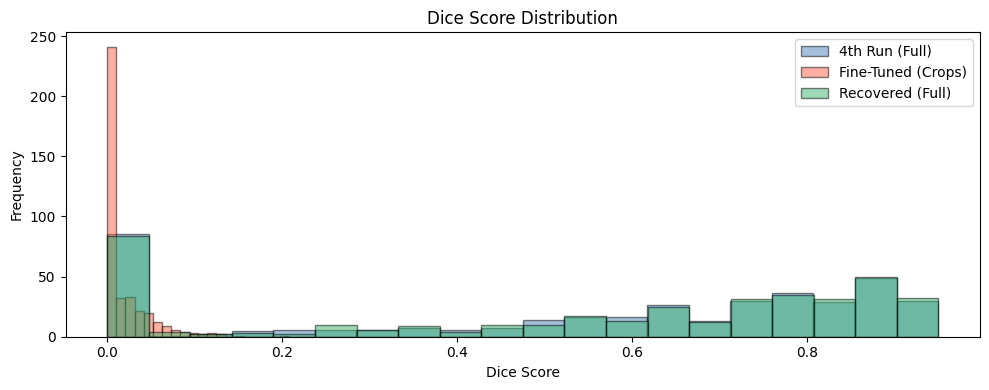

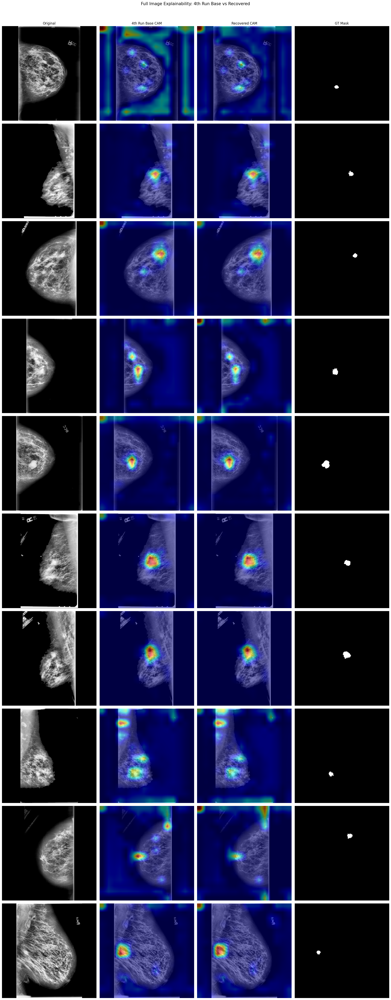

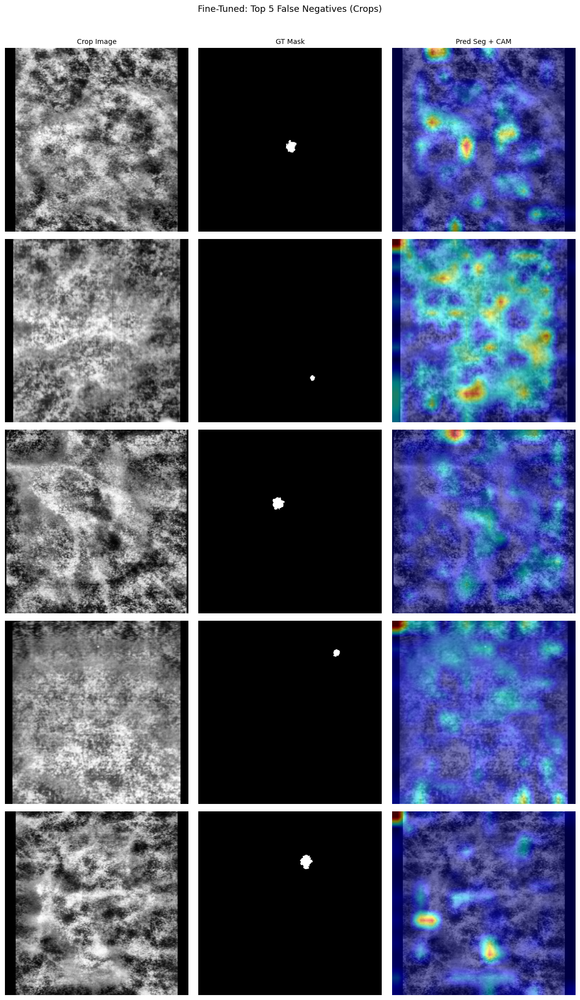

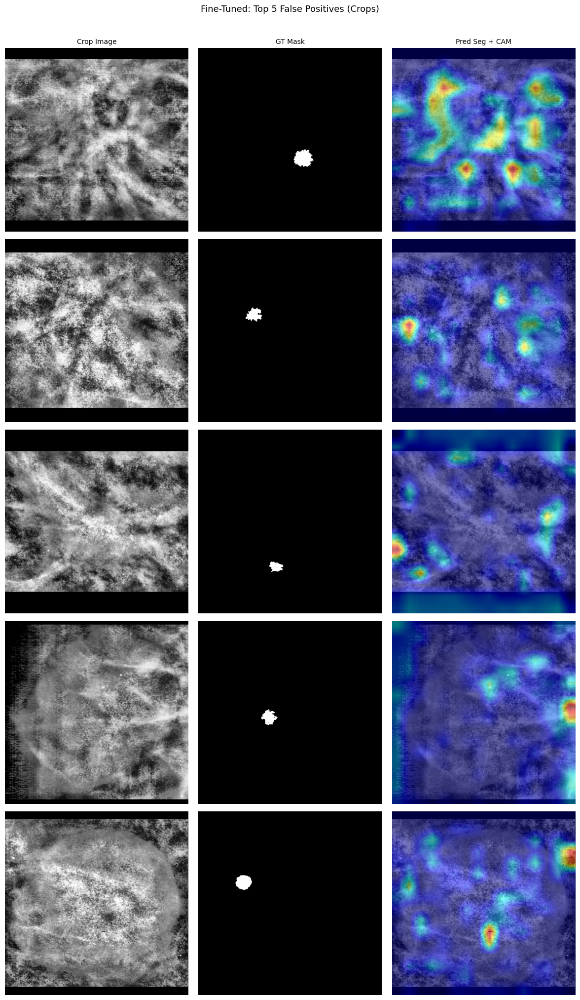

In [15]:
# ==============================================================================
# EXP-06 — Deep Explainability Analysis (Model A vs Model B vs Model C)
# ==============================================================================
import os
import cv2
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
 
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image
from sklearn.metrics import roc_auc_score
 
OUTPUT_DIR = "/kaggle/working/gradcam_outputs"
os.makedirs(OUTPUT_DIR, exist_ok=True)
 
class ClassificationWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
    def forward(self, x):
        _, class_score = self.model(x)
        return class_score
 
def compute_mgt(heatmap, gt_mask):
    threshold      = np.percentile(heatmap, 80)
    binarized_heat = (heatmap >= threshold).astype(np.float32)
    gt_bin         = (gt_mask > 0).astype(np.float32)
    intersection   = np.logical_and(binarized_heat, gt_bin).sum()
    union          = np.logical_or(binarized_heat, gt_bin).sum()
    return float(intersection / (union + 1e-8))
 
def norm_for_display(img_tensor):
    img      = img_tensor.squeeze().cpu().numpy()
    img_norm = (img - img.min()) / (img.max() - img.min() + 1e-8)
    return np.stack([img_norm] * 3, axis=-1).astype(np.float32)
 
def preprocess_sample(img_raw, roi_raw, patient_id, pipeline, image_type="FULL"):
    roi_binary = (roi_raw > 0).astype(np.float32)
    data_dict  = {
        "image":      img_raw,
        "roi":        roi_binary,
        "patient_id": patient_id,
        "image_type": image_type,
    }
    processed  = pipeline(data_dict)
    img_tensor = processed["image"].clone().detach().to(torch.float32)
    roi_np     = processed["roi"].squeeze().numpy()
    return img_tensor, roi_np
 
def run_exp_06_v3():
    set_seed(RANDOM_SEED)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using Device: {device}")
 
    # ----------------------------------------------------------
    # Load Models
    # ----------------------------------------------------------
    model_a = MTL_EfficientUNetPlusPlus().to(device)
    model_a.load_state_dict(torch.load("/kaggle/working/best_model_exp05.pth", map_location=device))
    model_a.eval()
    print("Loaded 4th run baseline: best_model_exp05.pth")
 
    model_b = MTL_EfficientUNetPlusPlus().to(device)
    model_b.load_state_dict(torch.load("/kaggle/working/best_model_finetuned.pth", map_location=device))
    model_b.eval()
    print("Loaded fine-tuned: best_model_finetuned.pth")

    model_c = MTL_EfficientUNetPlusPlus().to(device)
    try:
        model_c.load_state_dict(torch.load("/kaggle/working/best_model_recovered.pth", map_location=device))
        print("Loaded recovered: best_model_recovered.pth")
        run_model_c = True
    except FileNotFoundError:
        print("WARNING: best_model_recovered.pth not found. Skipping Model C.")
        run_model_c = False
 
    cam_a = GradCAMPlusPlus(model=ClassificationWrapper(model_a), target_layers=[model_a.smp_base.encoder.model.blocks[-2][-1]])
    cam_b = GradCAMPlusPlus(model=ClassificationWrapper(model_b), target_layers=[model_b.smp_base.encoder.model.blocks[-2][-1]])
    if run_model_c:
        cam_c = GradCAMPlusPlus(model=ClassificationWrapper(model_c), target_layers=[model_c.smp_base.encoder.model.blocks[-2][-1]])
 
    df       = pd.read_csv(CSV_PATH)
    eval_df  = df[df['Patient_Split'].isin(['Val', 'Test'])].copy().reset_index(drop=True)
    pipeline = build_val_pipeline()
 
    # ----------------------------------------------------------
    # Model A & C — full images vs full ROI masks
    # (Evaluated together to save I/O load times)
    # ----------------------------------------------------------
    print("\n--- Evaluating Model A (4th Run) & Model C (Recovered) on Full Images ---")
    results_a, results_c = [], []
    labels_ac, preds_a, preds_c = [], [], []
 
    for _, row in eval_df.iterrows():
        patient_id = row['PatientID']
        gt_label   = int(row['Label'])
 
        full_raw = cv2.imread(os.path.join(DATA_DIR, row['Full_Path']), cv2.IMREAD_UNCHANGED)
        roi_raw  = cv2.imread(os.path.join(DATA_DIR, row['ROI_Path']),  cv2.IMREAD_UNCHANGED)
        if full_raw is None or roi_raw is None: continue
 
        full_tensor, roi_np = preprocess_sample(full_raw, roi_raw, patient_id, pipeline, "FULL")
        img_input = full_tensor.unsqueeze(0).to(device)
 
        # --- Model A Inference ---
        with torch.no_grad():
            pred_mask_a, pred_score_a = model_a(img_input)
            score_a   = torch.sigmoid(pred_score_a).item()
            mask_a_np = (torch.sigmoid(pred_mask_a) > 0.5).squeeze().cpu().numpy().astype(np.float32)
        cam_out_a = cam_a(input_tensor=img_input, targets=None)[0]
        mgt_a     = compute_mgt(cam_out_a, roi_np)
        dice_a    = (2.0 * np.logical_and(mask_a_np, roi_np).sum()) / (mask_a_np.sum() + roi_np.sum() + 1e-8)
 
        labels_ac.append(gt_label)
        preds_a.append(score_a)
        results_a.append({
            'PatientID': patient_id, 'GT': gt_label, 'View': "CC" if "_CC" in patient_id.upper() else "MLO",
            'Score': score_a, 'Dice': float(dice_a), 'MGT': mgt_a,
            'Tensor': full_tensor.cpu(), 'GT_Mask': roi_np, 'Pred_Mask': mask_a_np, 'CAM': cam_out_a,
        })

        # --- Model C Inference ---
        if run_model_c:
            with torch.no_grad():
                pred_mask_c, pred_score_c = model_c(img_input)
                score_c   = torch.sigmoid(pred_score_c).item()
                mask_c_np = (torch.sigmoid(pred_mask_c) > 0.5).squeeze().cpu().numpy().astype(np.float32)
            cam_out_c = cam_c(input_tensor=img_input, targets=None)[0]
            mgt_c     = compute_mgt(cam_out_c, roi_np)
            dice_c    = (2.0 * np.logical_and(mask_c_np, roi_np).sum()) / (mask_c_np.sum() + roi_np.sum() + 1e-8)
            
            preds_c.append(score_c)
            results_c.append({
                'PatientID': patient_id, 'GT': gt_label, 'View': "CC" if "_CC" in patient_id.upper() else "MLO",
                'Score': score_c, 'Dice': float(dice_c), 'MGT': mgt_c,
                'Tensor': full_tensor.cpu(), 'GT_Mask': roi_np, 'Pred_Mask': mask_c_np, 'CAM': cam_out_c,
            })
 
    res_a = pd.DataFrame(results_a)
    auc_a = roc_auc_score(labels_ac, preds_a) if len(set(labels_ac)) > 1 else 0.5
    if run_model_c:
        res_c = pd.DataFrame(results_c)
        auc_c = roc_auc_score(labels_ac, preds_c) if len(set(labels_ac)) > 1 else 0.5
 
    # ----------------------------------------------------------
    # Model B — crop images vs crop-aligned ROI masks
    # Size filter: skip if crop mask area < 50 pixels
    # ----------------------------------------------------------
    print("--- Evaluating Model B (Fine-Tuned) on Crop Images ---")
    results_b = []
    labels_b, preds_b = [], []
    skipped = 0
 
    for _, row in eval_df.iterrows():
        patient_id = row['PatientID']
        gt_label   = int(row['Label'])
 
        if pd.isna(row.get('Crop_Path')) or pd.isna(row.get('Crop_ROI_Path')):
            skipped += 1; continue
 
        crop_raw     = cv2.imread(os.path.join(DATA_DIR, row['Crop_Path']),     cv2.IMREAD_UNCHANGED)
        crop_roi_raw = cv2.imread(os.path.join(DATA_DIR, row['Crop_ROI_Path']), cv2.IMREAD_UNCHANGED)
        if crop_raw is None or crop_roi_raw is None:
            skipped += 1; continue
 
        if (crop_roi_raw > 0).sum() < 50:
            skipped += 1; continue
 
        crop_tensor, crop_roi_np = preprocess_sample(crop_raw, crop_roi_raw, patient_id, pipeline, "CROP")
        img_input = crop_tensor.unsqueeze(0).to(device)
 
        with torch.no_grad():
            pred_mask, pred_score = model_b(img_input)
            score   = torch.sigmoid(pred_score).item()
            mask_np = (torch.sigmoid(pred_mask) > 0.5).squeeze().cpu().numpy().astype(np.float32)
 
        cam_out = cam_b(input_tensor=img_input, targets=None)[0]
        mgt     = compute_mgt(cam_out, crop_roi_np)
        dice    = (2.0 * np.logical_and(mask_np, crop_roi_np).sum()) / (mask_np.sum() + crop_roi_np.sum() + 1e-8)
 
        labels_b.append(gt_label)
        preds_b.append(score)
        results_b.append({
            'PatientID': patient_id, 'GT': gt_label, 'View': "CC" if "_CC" in patient_id.upper() else "MLO",
            'Score': score, 'Dice': float(dice), 'MGT': mgt,
            'Tensor': crop_tensor.cpu(), 'GT_Mask': crop_roi_np, 'Pred_Mask': mask_np, 'CAM': cam_out,
        })
 
    print(f"Skipped {skipped} crop samples (missing paths or mask < 50px)")
    res_b = pd.DataFrame(results_b)
    auc_b = roc_auc_score(labels_b, preds_b) if len(set(labels_b)) > 1 else 0.5
 
    # ----------------------------------------------------------
    # Summary
    # ----------------------------------------------------------
    print("\n========== EXP-06 v3: COMPARISON SUMMARY ==========")
    print(f"{'Metric':<18} | {'4th Run (Full)':<15} | {'FT (Crops)':<15} | {'Recovered (Full)':<15}")
    print("-" * 72)
    auc_c_str  = f"{auc_c:<15.4f}" if run_model_c else "N/A"
    dice_c_str = f"{res_c['Dice'].mean():<15.4f}" if run_model_c else "N/A"
    mgt_c_str  = f"{res_c['MGT'].mean():<15.4f}" if run_model_c else "N/A"
    len_c_str  = f"{len(res_c):<15}" if run_model_c else "N/A"

    print(f"{'AUC':<18} | {auc_a:<15.4f} | {auc_b:<15.4f} | {auc_c_str}")
    print(f"{'Avg Dice':<18} | {res_a['Dice'].mean():<15.4f} | {res_b['Dice'].mean():<15.4f} | {dice_c_str}")
    print(f"{'Avg MGT':<18} | {res_a['MGT'].mean():<15.4f} | {res_b['MGT'].mean():<15.4f} | {mgt_c_str}")
    print(f"{'Samples evaluated':<18} | {len(res_a):<15} | {len(res_b):<15} | {len_c_str}")
 
    print("\n--- By View (4th Run on Full) ---")
    for view in ['CC', 'MLO']:
        sub = res_a[res_a['View'] == view]
        if len(sub) > 0: print(f"[{view}] Dice: {sub['Dice'].mean():.4f} | MGT: {sub['MGT'].mean():.4f}")

    print("\n--- By View (Fine-Tuned on Crops) ---")
    for view in ['CC', 'MLO']:
        sub = res_b[res_b['View'] == view]
        if len(sub) > 0: print(f"[{view}] Dice: {sub['Dice'].mean():.4f} | MGT: {sub['MGT'].mean():.4f}")

    if run_model_c:
        print("\n--- By View (Recovered on Full) ---")
        for view in ['CC', 'MLO']:
            sub = res_c[res_c['View'] == view]
            if len(sub) > 0: print(f"[{view}] Dice: {sub['Dice'].mean():.4f} | MGT: {sub['MGT'].mean():.4f}")
 
    # ----------------------------------------------------------
    # Dice histogram
    # ----------------------------------------------------------
    plt.figure(figsize=(10, 4))
    plt.hist(res_a['Dice'], bins=20, alpha=0.5, label='4th Run (Full)',  color='steelblue', edgecolor='black')
    plt.hist(res_b['Dice'], bins=20, alpha=0.5, label='Fine-Tuned (Crops)', color='tomato', edgecolor='black')
    if run_model_c:
        plt.hist(res_c['Dice'], bins=20, alpha=0.5, label='Recovered (Full)', color='mediumseagreen', edgecolor='black')
    plt.title("Dice Score Distribution")
    plt.xlabel("Dice Score")
    plt.ylabel("Frequency")
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, "dice_histogram_v3.png"), dpi=100)
    plt.show()
 
    # ----------------------------------------------------------
    # Side-by-side CAM visualization (Model A vs Model C on Full)
    # ----------------------------------------------------------
    if run_model_c:
        vis_df = pd.concat([
            res_c[res_c['GT'] == 0].sample(min(5, (res_c['GT'] == 0).sum()), random_state=42),
            res_c[res_c['GT'] == 1].sample(min(5, (res_c['GT'] == 1).sum()), random_state=42),
        ]).reset_index(drop=True)
     
        n = len(vis_df)
        fig, axes = plt.subplots(n, 4, figsize=(20, 5 * n))
        fig.suptitle("Full Image Explainability: 4th Run Base vs Recovered", fontsize=15, y=1.01)
        headers = ["Original", "4th Run Base CAM", "Recovered CAM", "GT Mask"]
        for col, t in enumerate(headers):
            axes[0, col].set_title(t, fontsize=12)
     
        for i, row in vis_df.iterrows():
            # Get matching row from Model A to compare
            row_a = res_a[res_a['PatientID'] == row['PatientID']].iloc[0]

            ax   = axes[i] if n > 1 else axes
            norm = norm_for_display(row['Tensor'])
            
            # Original
            ax[0].imshow(norm, cmap='gray')
            ax[0].set_ylabel(f"{'Mal' if row['GT']==1 else 'Ben'}\n{row['PatientID']}", fontsize=9)
            ax[0].axis('off')

            # Model A
            cam_img_a = show_cam_on_image(norm, row_a['CAM'], use_rgb=True, colormap=cv2.COLORMAP_JET)
            ax[1].imshow(cam_img_a)
            ax[1].set_xlabel(f"Base Pred:{row_a['Score']:.2f} | Dice:{row_a['Dice']:.3f} | MGT:{row_a['MGT']:.3f}", fontsize=9)
            ax[1].axis('off')

            # Model C
            cam_img_c = show_cam_on_image(norm, row['CAM'], use_rgb=True, colormap=cv2.COLORMAP_JET)
            ax[2].imshow(cam_img_c)
            ax[2].set_xlabel(f"Rec Pred:{row['Score']:.2f} | Dice:{row['Dice']:.3f} | MGT:{row['MGT']:.3f}", fontsize=9)
            ax[2].axis('off')

            # GT
            ax[3].imshow(row['GT_Mask'], cmap='gray')
            ax[3].axis('off')
     
        plt.tight_layout()
        plt.savefig(os.path.join(OUTPUT_DIR, "gradcam_full_comparison_ac.png"), dpi=100, bbox_inches='tight')
        plt.show()
 
    # ----------------------------------------------------------
    # FN / FP on fine-tuned model (crops)
    # ----------------------------------------------------------
    res_b['correct']  = res_b.apply(lambda r: (1 if r['Score'] > 0.5 else 0) == r['GT'], axis=1)
    res_b['category'] = res_b.apply(
        lambda r: ("TP" if r['GT']==1 else "TN") if r['correct'] else ("FN" if r['GT']==1 else "FP"), axis=1
    )
 
    def plot_errors(category, title):
        errors = res_b[res_b['category'] == category].sort_values('Score', ascending=(category=='FN')).head(5)
        if len(errors) == 0: return
        n = len(errors)
        fig, axes = plt.subplots(n, 3, figsize=(12, 4 * n))
        fig.suptitle(title, fontsize=13, y=1.01)
        for col, t in enumerate(["Crop Image", "GT Mask", "Pred Seg + CAM"]):
            (axes[0, col] if n > 1 else axes[col]).set_title(t, fontsize=10)
        for i, (_, row) in enumerate(errors.iterrows()):
            ax   = axes[i] if n > 1 else axes
            norm = norm_for_display(row['Tensor'])
            ax[0].imshow(norm, cmap='gray')
            ax[0].set_ylabel(f"Score:{row['Score']:.2f}", fontsize=8)
            ax[0].axis('off')
            ax[1].imshow(row['GT_Mask'], cmap='gray')
            ax[1].axis('off')
            cam_img = show_cam_on_image(norm, row['CAM'], use_rgb=True, colormap=cv2.COLORMAP_JET)
            ax[2].imshow(cam_img)
            ax[2].set_xlabel(f"Dice:{row['Dice']:.3f} MGT:{row['MGT']:.3f}", fontsize=8)
            ax[2].axis('off')
        plt.tight_layout()
        plt.savefig(os.path.join(OUTPUT_DIR, f"errors_{category}_crops.png"), dpi=100, bbox_inches='tight')
        plt.show()
 
    plot_errors("FN", "Fine-Tuned: Top 5 False Negatives (Crops)")
    plot_errors("FP", "Fine-Tuned: Top 5 False Positives (Crops)")
 
run_exp_06_v3()